## <h1><center>Exploratory Data Analysis and Predict  of Chronic Kidney Disease <h1><center>


## Load Modules

In [85]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import plotly.express as px
import warnings
warnings.simplefilter('ignore')
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, plot_confusion_matrix, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier





## Load files

In [3]:
df = pd.read_csv('kidney_disease.csv')

In [4]:
df.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd


## Data Dictionary
age - age 

bp - blood pressure 

sg - specific gravity

al - albumin

su - sugar

rbc - red blood cells

pc - pus cell

pcc - pus cell clumps

ba - bacteria

bgr - blood glucose random

bu - blood urea

sc - serum creatinine

sod - sodium

pot - potassium

hemo - hemoglobin

pcv - packed cell volume

wc - white blood cell count

rc - red blood cell count

htn - hypertension

dm - diabetes mellitus

cad - coronary artery disease

appet - appetite

pe - pedal edema

ane - anemia

classification - class ( the target features)

# The number of rows and columns

In [5]:
df.shape

(400, 26)

## The information for my data

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

## Renaming the columns to have meaningful names

In [7]:
#change the name of columns 
col={'id':'Id',"age":'Age',"bp":"blood_pressure",
          "sg":"specific_gravity",
          "al":"albumin",
          "su":"sugar",
          "rbc":"red_blood_cells",
          "pc":"pus_cell",
          "pcc":"pus_cell_clumps",
          "ba":"bacteria",
          "bgr":"blood_glucose_random",
          "bu":"blood_urea",
          "sc":"serum_creatinine",
          "sod":"sodium",
          "pot":"potassium",
          "hemo":"hemoglobin",
          "pcv":"packed_cell_volume",
          "wc":"white_blood_cell_count",
          "rc":"red_blood_cell_count",
          "htn":"hypertension",
          "dm":"diabetes_mellitus",
          "cad":"coronary_artery_disease",
          "appet":"appetite",
          "pe":"pedal_edema",
          "ane":"anemia"}

df.rename(columns=col , inplace=True)

In [8]:
df.columns

Index(['Id', 'Age', 'blood_pressure', 'specific_gravity', 'albumin', 'sugar',
       'red_blood_cells', 'pus_cell', 'pus_cell_clumps', 'bacteria',
       'blood_glucose_random', 'blood_urea', 'serum_creatinine', 'sodium',
       'potassium', 'hemoglobin', 'packed_cell_volume',
       'white_blood_cell_count', 'red_blood_cell_count', 'hypertension',
       'diabetes_mellitus', 'coronary_artery_disease', 'appetite',
       'pedal_edema', 'anemia', 'classification'],
      dtype='object')

In [9]:
df.to_csv('newfile', sep='\t')

# Feature description

In [10]:
#find all unique value for all columns 
for i in df.select_dtypes(include=['object']).columns:
    print('{} has unique values {}'.format(i,df[i].unique()),'\n')

red_blood_cells has unique values [nan 'normal' 'abnormal'] 

pus_cell has unique values ['normal' 'abnormal' nan] 

pus_cell_clumps has unique values ['notpresent' 'present' nan] 

bacteria has unique values ['notpresent' 'present' nan] 

packed_cell_volume has unique values ['44' '38' '31' '32' '35' '39' '36' '33' '29' '28' nan '16' '24' '37' '30'
 '34' '40' '45' '27' '48' '\t?' '52' '14' '22' '18' '42' '17' '46' '23'
 '19' '25' '41' '26' '15' '21' '43' '20' '\t43' '47' '9' '49' '50' '53'
 '51' '54'] 

white_blood_cell_count has unique values ['7800' '6000' '7500' '6700' '7300' nan '6900' '9600' '12100' '4500'
 '12200' '11000' '3800' '11400' '5300' '9200' '6200' '8300' '8400' '10300'
 '9800' '9100' '7900' '6400' '8600' '18900' '21600' '4300' '8500' '11300'
 '7200' '7700' '14600' '6300' '\t6200' '7100' '11800' '9400' '5500' '5800'
 '13200' '12500' '5600' '7000' '11900' '10400' '10700' '12700' '6800'
 '6500' '13600' '10200' '9000' '14900' '8200' '15200' '5000' '16300'
 '12400' '\t8400'

In [11]:
for i in df.select_dtypes(include=['float64']).columns:
    print('{} has unique values {}'.format(i,df[i].unique()),'\n')


Age has unique values [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.] 

blood_pressure has unique values [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.] 

specific_gravity has unique values [1.02  1.01  1.005 1.015   nan 1.025] 

albumin has unique values [ 1.  4.  2.  3.  0. nan  5.] 

sugar has unique values [ 0.  3.  4.  1. nan  2.  5.] 

blood_glucose_random has unique values [121.  nan 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98.
 157.  76.  99. 114. 263. 173.  95. 108. 156. 264. 123.  93. 107. 159.
 140. 171. 270.  92. 137. 204.  79. 207. 124. 144.  91. 162. 246. 253.
 141. 182.  86. 150. 146. 425. 112. 250. 360. 163. 129. 133. 102. 158.
 165. 132. 104. 127. 415. 169. 251. 109. 280. 210. 219. 29

### As it can be seen, red_blood_cell_count, packed_cell_volume and white_blood_cell_count are object type. We need to change to numerical dtype.

In [12]:
#change theses columns from type object to folat 
df['red_blood_cell_count']  = pd.to_numeric(df['red_blood_cell_count'], errors='coerce')
df['white_blood_cell_count'] = pd.to_numeric(df['white_blood_cell_count'], errors='coerce')
df['packed_cell_volume'] = pd.to_numeric(df['packed_cell_volume'], errors='coerce')


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Id                       400 non-null    int64  
 1   Age                      391 non-null    float64
 2   blood_pressure           388 non-null    float64
 3   specific_gravity         353 non-null    float64
 4   albumin                  354 non-null    float64
 5   sugar                    351 non-null    float64
 6   red_blood_cells          248 non-null    object 
 7   pus_cell                 335 non-null    object 
 8   pus_cell_clumps          396 non-null    object 
 9   bacteria                 396 non-null    object 
 10  blood_glucose_random     356 non-null    float64
 11  blood_urea               381 non-null    float64
 12  serum_creatinine         383 non-null    float64
 13  sodium                   313 non-null    float64
 14  potassium                3

## Observation:

There are multiple incorrect values present in the columns like \tyes and \tno in coronary_artery_disease .
Let’s replace those values with correct values

In [14]:
df['classification'] = df['classification'].replace(to_replace = 'ckd\t', value='ckd')
df['coronary_artery_disease'] = df['coronary_artery_disease'].replace(to_replace = '\tno', value='no')
df['diabetes_mellitus'] = df['coronary_artery_disease'].replace(to_replace = '\tno', value='no')
df['diabetes_mellitus'] = df['coronary_artery_disease'].replace(to_replace='\tyes',value='yes')
df['red_blood_cell_count'] = df['red_blood_cell_count'].replace(to_replace='\t?',value=np.nan)
df['white_blood_cell_count'] = df['white_blood_cell_count'].replace(to_replace='\t6200',value='6200')
df['white_blood_cell_count'] = df['white_blood_cell_count'].replace(to_replace='\t8400',value='8400')
df['white_blood_cell_count'] = df['red_blood_cell_count'].replace(to_replace='\t?',value=np.nan)
df['packed_cell_volume'] = df['packed_cell_volume'].replace(to_replace='\t?',value=np.nan)
df['packed_cell_volume'] = df['packed_cell_volume'].replace(to_replace='\t43',value='43')

## Check missing values


In [15]:
#find the missing value
df.isnull().sum().sort_values(ascending=False)

red_blood_cells            152
red_blood_cell_count       131
white_blood_cell_count     131
potassium                   88
sodium                      87
packed_cell_volume          71
pus_cell                    65
hemoglobin                  52
sugar                       49
specific_gravity            47
albumin                     46
blood_glucose_random        44
blood_urea                  19
serum_creatinine            17
blood_pressure              12
Age                          9
bacteria                     4
pus_cell_clumps              4
hypertension                 2
diabetes_mellitus            2
coronary_artery_disease      2
anemia                       1
appetite                     1
pedal_edema                  1
Id                           0
classification               0
dtype: int64

## From the above we can see that our columns have missing values, Lets check missing values percentage

In [16]:
# Percentage of missing values
((df.isnull().sum()/df.shape[0])*100).sort_values(ascending=False)

red_blood_cells            38.00
red_blood_cell_count       32.75
white_blood_cell_count     32.75
potassium                  22.00
sodium                     21.75
packed_cell_volume         17.75
pus_cell                   16.25
hemoglobin                 13.00
sugar                      12.25
specific_gravity           11.75
albumin                    11.50
blood_glucose_random       11.00
blood_urea                  4.75
serum_creatinine            4.25
blood_pressure              3.00
Age                         2.25
bacteria                    1.00
pus_cell_clumps             1.00
hypertension                0.50
diabetes_mellitus           0.50
coronary_artery_disease     0.50
anemia                      0.25
appetite                    0.25
pedal_edema                 0.25
Id                          0.00
classification              0.00
dtype: float64

<AxesSubplot:>

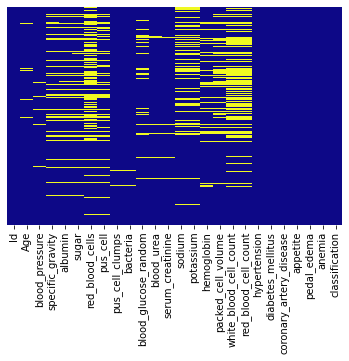

In [17]:
 sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='plasma')

## Deal with missing value 

### First drop the null value for the coulmns that contains less than 5 perecent 

In [18]:
#drop the null value for the coulms that contains less than 5 perecent 
df.dropna(axis=0, subset=['blood_urea' , 'serum_creatinine','blood_pressure','Age','bacteria','pus_cell_clumps','hypertension','diabetes_mellitus','coronary_artery_disease','anemia','appetite','pedal_edema'],inplace=True)

### Second Fill the the numerical columns with mean

In [19]:
for i in df.select_dtypes(include=['float64']) :
    df[i].fillna(df[i].mean(),inplace=True)

### Third Fill the category columns with mode

In [20]:
for i in df.select_dtypes(include=['object']) :
    df[i].fillna(df[i].mode()[0],inplace=True)

## Check the data after deal with missing value

In [21]:
df.shape

(355, 26)

## Check if there are outliers

In [22]:
from collections import Counter
def outliers(df,features):
    outlier_indices=[]
    
    for c in features:
        Q1=np.percentile(df[c],25) #1st quartile
        Q3=np.percentile(df[c],75) #3rd quartile
        IQR=Q3-Q1                  #IQR
        outlier_step=IQR*1.5       #Outlier step
        outlier_list_col=df[(df[c]<Q1-outlier_step) | (df[c]>Q3 + outlier_step)].index #Detect outlier and their indeces
        outlier_indices.extend(outlier_list_col) 
        
    outlier_indices = Counter(outlier_indices)
    multiple_outliers=list(i for i,v in outlier_indices.items() if v>2)
    
    return multiple_outliers

df.loc[outliers(df,df.select_dtypes(include=['float64']))]

,Id,Age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,...,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,pedal_edema,anemia,classification
18,18,60.0,100.0,1.025000,0.000000,3.000000,normal,normal,notpresent,notpresent,...,37.000000,4.300000,4.300000,yes,yes,yes,good,no,no,ckd
90,90,63.0,100.0,1.010000,2.000000,2.000000,normal,normal,notpresent,present,...,40.000000,4.200000,4.200000,yes,yes,yes,good,no,no,ckd
93,93,73.0,100.0,1.010000,3.000000,2.000000,abnormal,abnormal,present,notpresent,...,30.000000,3.200000,3.200000,yes,yes,yes,poor,no,no,ckd
98,98,50.0,140.0,1.017524,1.034921,0.467949,normal,normal,notpresent,notpresent,...,18.000000,2.300000,2.300000,yes,no,no,poor,no,yes,ckd
99,99,56.0,180.0,1.017524,0.000000,4.000000,normal,abnormal,notpresent,notpresent,...,32.000000,4.200000,4.200000,yes,no,no,poor,yes,no,ckd
107,107,55.0,100.0,1.015000,1.000000,4.000000,normal,normal,notpresent,notpresent,...,34.000000,4.400000,4.400000,yes,no,no,good,no,no,ckd
133,133,70.0,100.0,1.015000,4.000000,0.000000,normal,normal,notpresent,notpresent,...,37.000000,8.000000,8.000000,yes,no,no,good,no,no,ckd
175,175,60.0,50.0,1.010000,0.000000,0.000000,normal,normal,notpresent,notpresent,...,38.841751,3.400000,3.400000,yes,no,no,good,no,no,ckd
196,196,49.0,100.0,1.010000,3.000000,0.000000,abnormal,abnormal,notpresent,notpresent,...,24.000000,3.500000,3.500000,yes,no,no,poor,yes,yes,ckd
198,198,59.0,100.0,1.020000,4.000000,2.000000,normal,normal,notpresent,notpresent,...,30.000000,3.900000,3.900000,yes,no,no,poor,yes,no,ckd


## Describe the data

In [23]:
#describe the data
df.describe()

,Id,Age,blood_pressure,specific_gravity,albumin,sugar,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,hemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count
count,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000
mean,200.600000,52.490141,76.676056,1.017524,1.034921,0.467949,148.134146,57.887887,3.080704,137.419861,4.652098,12.525240,38.841751,4.679268,4.679268
std,117.657686,16.228133,13.908270,0.005383,1.285090,1.054556,75.554188,51.027094,5.855687,9.691667,2.986842,2.744008,8.251958,0.859583,0.859583
min,0.000000,5.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000,9.000000,2.100000,2.100000
25%,97.500000,43.000000,70.000000,1.015000,0.000000,0.000000,100.000000,27.000000,0.900000,135.000000,3.900000,10.850000,33.500000,4.400000,4.400000
50%,201.000000,55.000000,80.000000,1.017524,1.000000,0.000000,124.000000,42.000000,1.300000,137.419861,4.652098,12.525240,38.841751,4.679268,4.679268
75%,304.500000,65.000000,80.000000,1.020000,2.000000,0.467949,156.500000,66.000000,2.800000,141.000000,4.800000,14.650000,44.000000,5.100000,5.100000
max,399.000000,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000,54.000000,8.000000,8.000000


# Analysis the data with Visualization

## look pairwise relationships in a dataset

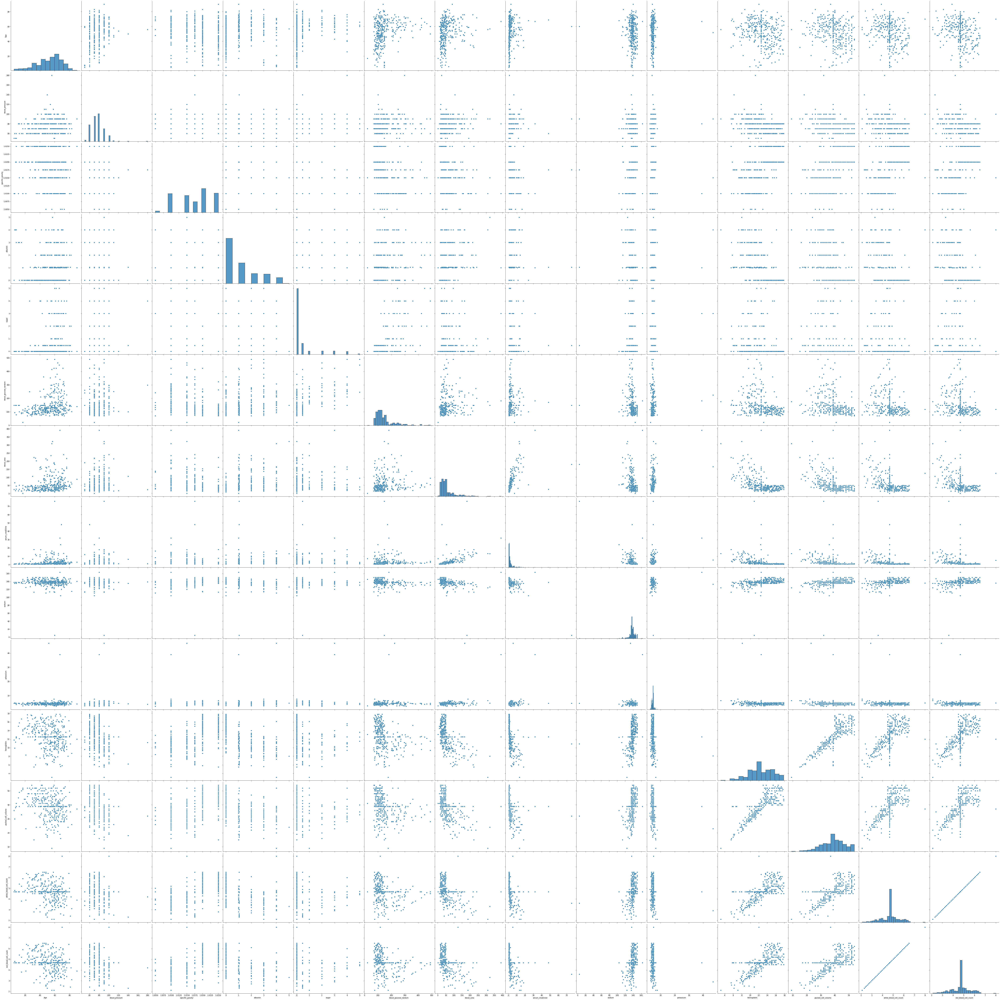

In [24]:
sns.pairplot(df.select_dtypes(include=['float64']),size=6,height=3)

## look pairwise relationships in a dataset and use Variable classification in huename to aspects the different colors.

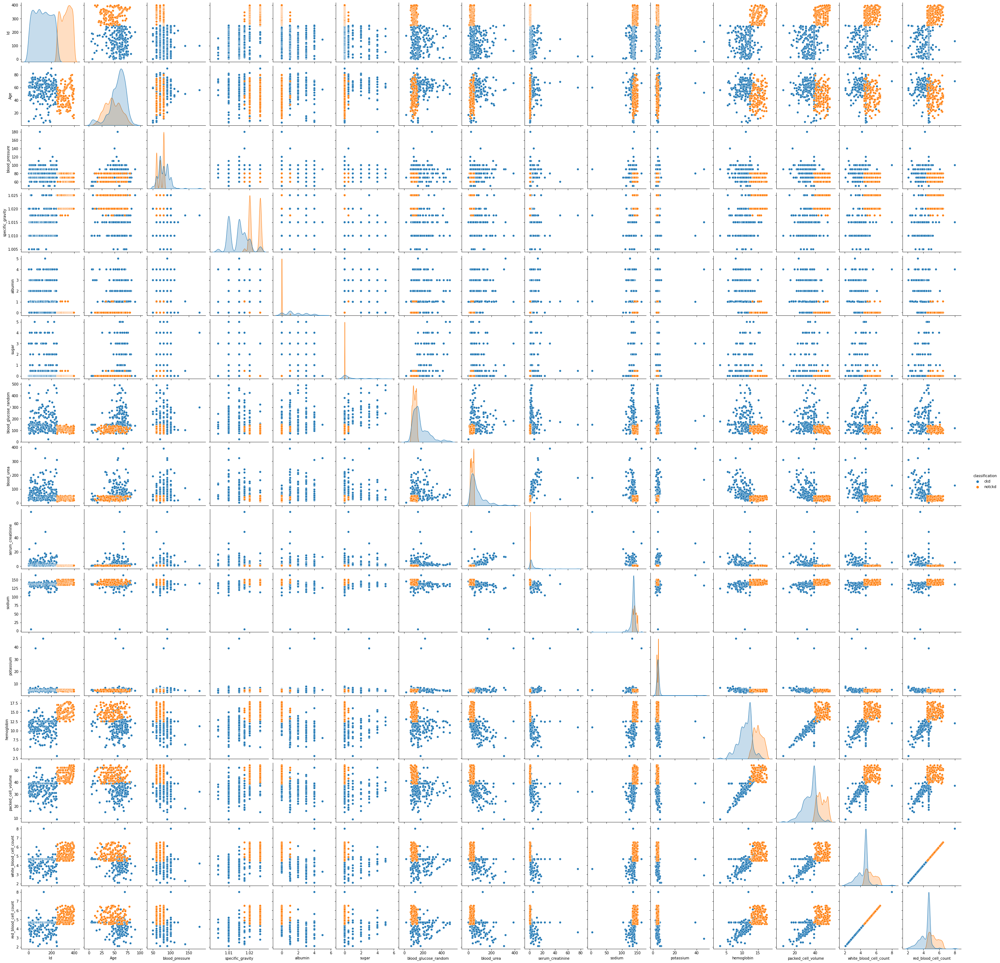

In [25]:
sns.pairplot(df,hue='classification',diag_kws={'bw': 0.2})

In [26]:
df.sort_values(by=["Age"],inplace=True)

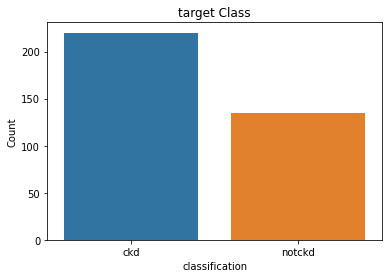

Percent of chronic kidney disease sample:  61.97 %
Percent of not a chronic kidney disease sample:  38.03 %


In [27]:
sns.countplot(x='classification',data=df)
plt.xlabel("classification")
plt.ylabel("Count")
plt.title("target Class")
plt.show()
print('Percent of chronic kidney disease sample: ',round(len(df[df['classification']=='ckd'])/len(df['classification'])*100,2),"%")
print('Percent of not a chronic kidney disease sample: ',round(len(df[df['classification']=='notckd'])/len(df['classification'])*100,2),"%")

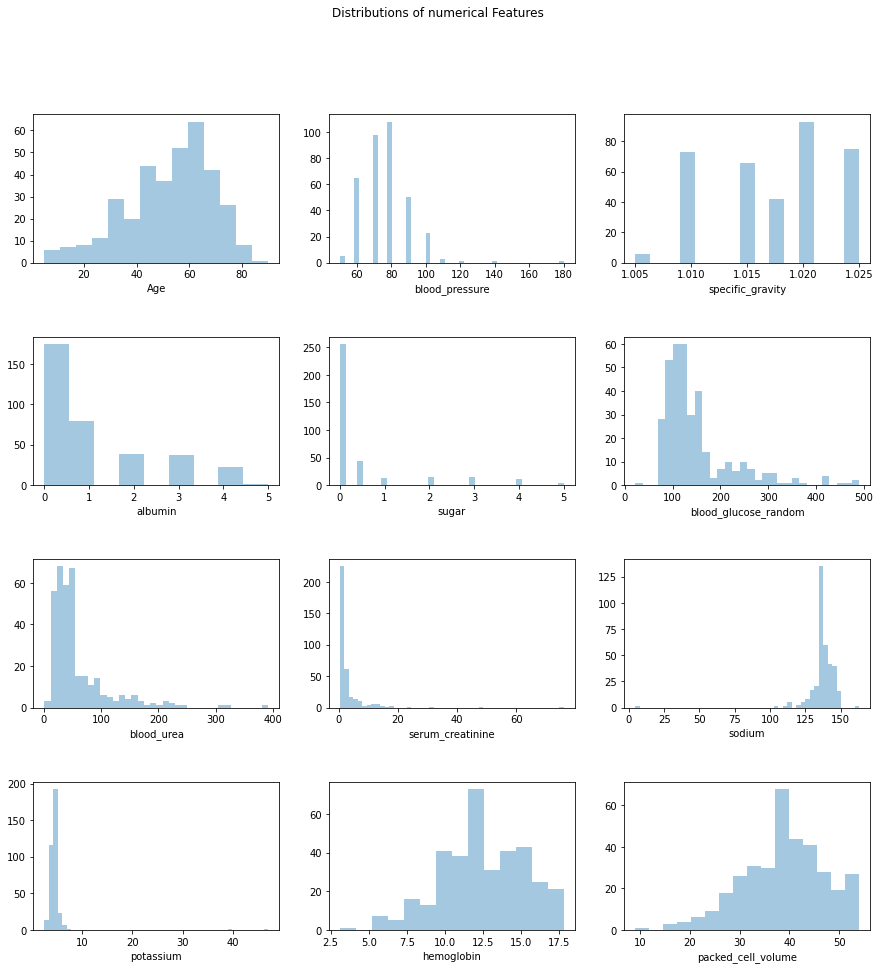

In [28]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15,15))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('Distributions of numerical Features')


for ax, feats in zip(axes.flatten(), df.select_dtypes(include=['float64'])):
    sns.distplot(a=df[feats], ax=ax , kde=False)
    

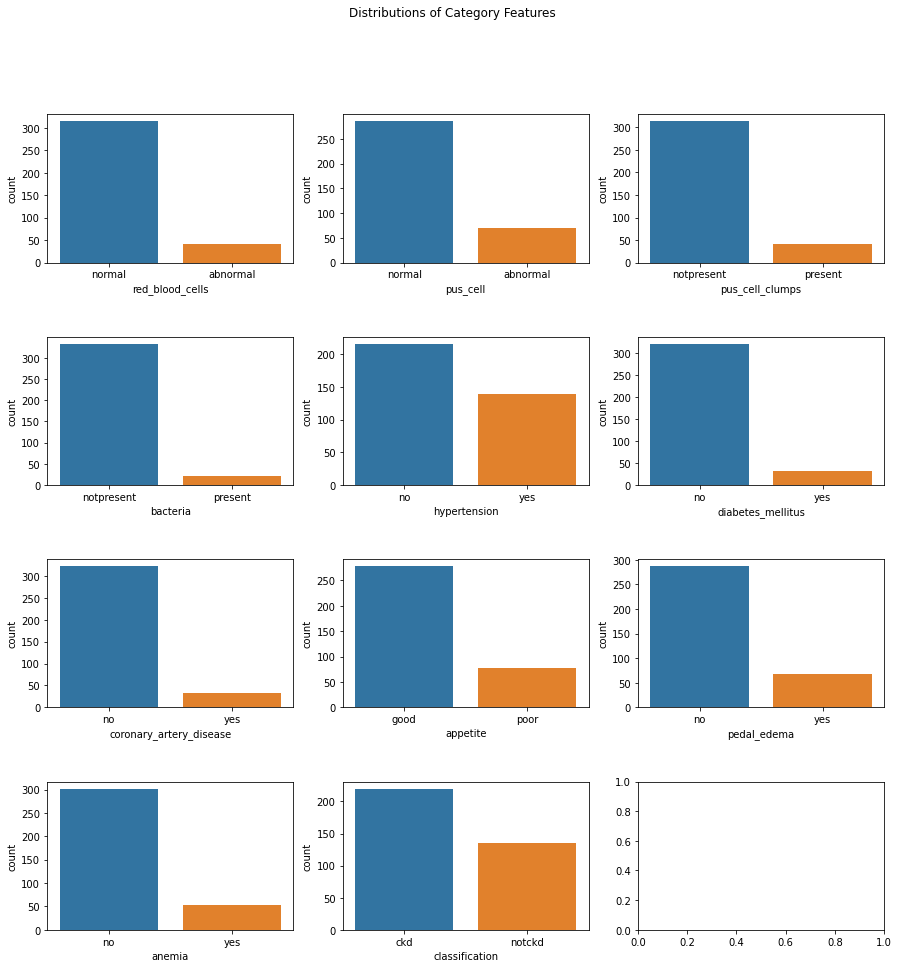

In [29]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15,15))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('Distributions of Category Features')


for ax, feats in zip(axes.flatten(), df.select_dtypes(include=['object'])):
    sns.countplot(df[feats], ax=ax)

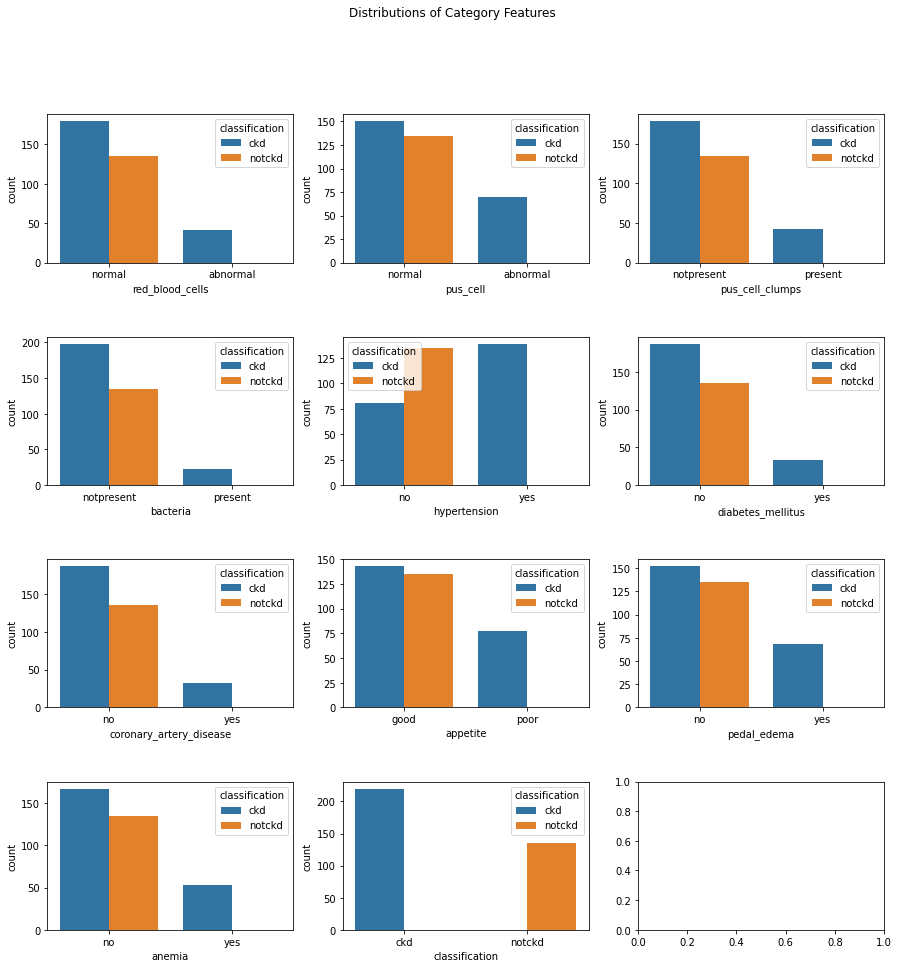

In [30]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15,15))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('Distributions of Category Features')

for ax, feats in zip(axes.flatten(), df.select_dtypes(include=['object'])):
    sns.countplot(df[feats], ax=ax , hue='classification' , data=df)

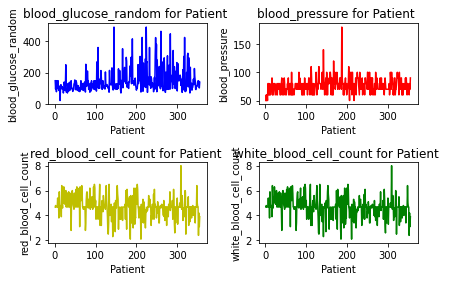

In [31]:
Patient_figure, Patient_axes = plt.subplots(nrows=2, ncols=2)

Patient = np.linspace(1, 355, 355)
axes1 = Patient_axes[0][0]
axes1.plot(Patient,df['blood_glucose_random'],'b')
axes1.set_xlabel('Patient')
axes1.set_ylabel('blood_glucose_random')
axes1.set_title('blood_glucose_random for Patient ')
#blood_pressure has unique values [ 80.  50.  70.  90 , 100.  60. 110. 140. 180. 120.] 
axes2 = Patient_axes[0][1]
axes2.plot(Patient,df['blood_pressure'],'r')
axes2.set_xlabel('Patient')
axes2.set_ylabel('blood_pressure')
axes2.set_title('blood_pressure for Patient ')

axes3 = Patient_axes[1][0]
axes3.plot(Patient,df['red_blood_cell_count'],'y')
axes3.set_xlabel('Patient')
axes3.set_ylabel('red_blood_cell_count')
axes3.set_title('red_blood_cell_count for Patient ')


axes4 = Patient_axes[1][1]
axes4.plot(Patient,df['white_blood_cell_count'],'g')
axes4.set_xlabel('Patient')
axes4.set_ylabel('white_blood_cell_count')
axes4.set_title('white_blood_cell_count for Patient ')
Patient_figure.tight_layout()




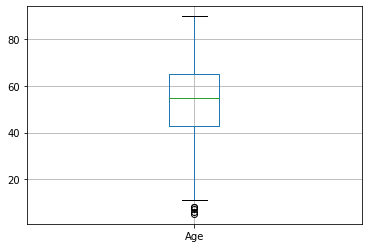

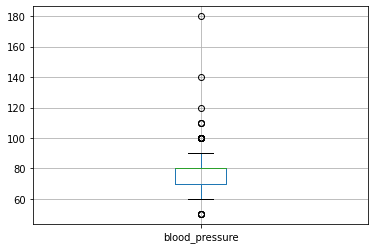

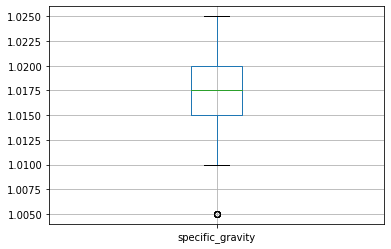

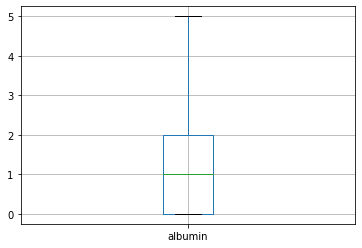

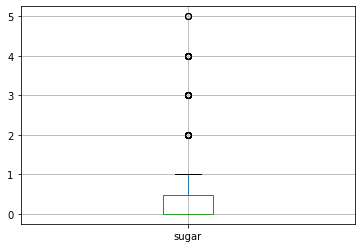

...

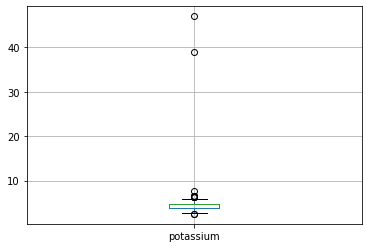

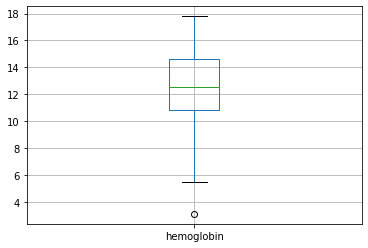

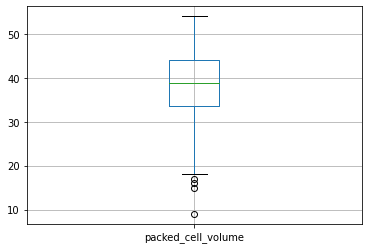

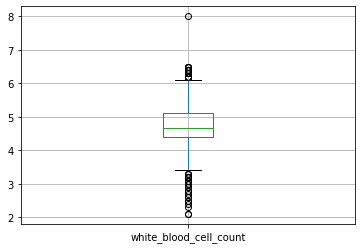

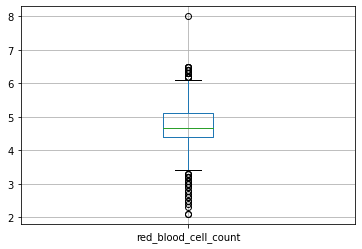

In [32]:
for column in df.select_dtypes(include=['float64']):
    plt.figure()
    df.boxplot([column])

## use the correlation to find relation between teo feathers 

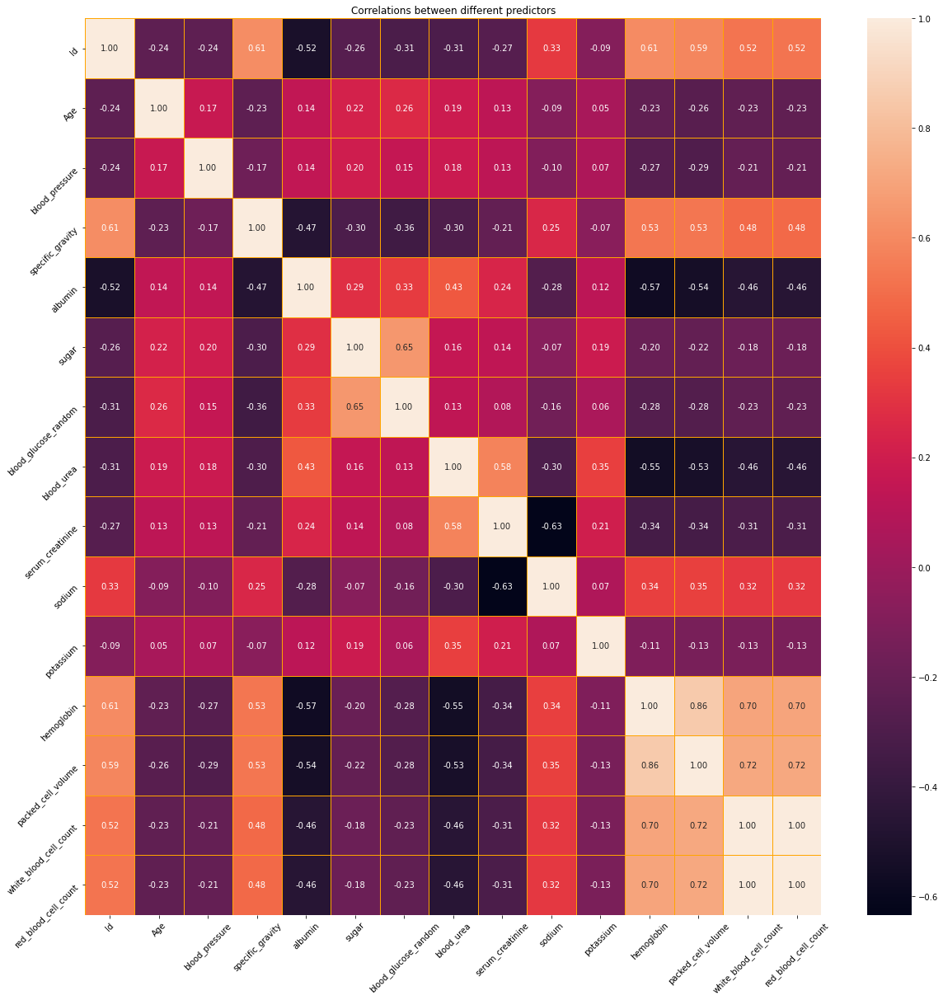

In [33]:
corr_df = df.corr()
f,ax=plt.subplots(figsize=(20,20))
sns.heatmap(corr_df,annot=True,fmt=".2f",ax=ax,linewidths=0.5,linecolor="orange")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.title('Correlations between different predictors')
plt.show()

## Let's check for Positive correlation

In [34]:
fig = px.scatter(df, x="packed_cell_volume", y="specific_gravity", color="classification")
fig.show()

In [35]:
fig = px.scatter(df, x="red_blood_cell_count", y="hemoglobin", color="classification")
fig.show() 

In [36]:
fig = px.scatter(df, x="packed_cell_volume", y="white_blood_cell_count", color="classification")
fig.show() 


In [37]:
fig = px.scatter(df, x="packed_cell_volume", y="red_blood_cell_count", color="classification")
fig.show()

In [38]:
fig = px.scatter(df, x="red_blood_cell_count", y="specific_gravity", color="classification")
fig.show()

In [39]:
fig = px.scatter(df, x="red_blood_cell_count", y="hemoglobin", color="classification")
fig.show()

In [40]:
fig = px.scatter(df, x="red_blood_cell_count", y="white_blood_cell_count", color="classification")
fig.show()

In [41]:
fig = px.scatter(df, x="white_blood_cell_count", y="specific_gravity", color="classification")
fig.show()

In [42]:
fig = px.scatter(df, x="white_blood_cell_count", y="hemoglobin", color="classification")
fig.show()

In [43]:
fig = px.scatter(df, x="hemoglobin", y="specific_gravity", color="classification")
fig.show()

In [44]:
fig = px.scatter(df, x="blood_glucose_random", y="sugar", color="classification")
fig.show()

## Let's check for Negative correlation 

In [45]:
fig = px.scatter(df, x="packed_cell_volume", y="albumin", color="classification")
fig.show()

In [46]:
fig = px.scatter(df, x="packed_cell_volume", y="blood_urea", color="classification")
fig.show()

In [47]:
fig = px.scatter(df, x="red_blood_cell_count", y="albumin", color="classification")
fig.show()


In [48]:
fig = px.scatter(df, x="red_blood_cell_count", y="blood_urea", color="classification")
fig.show()

In [49]:
fig = px.scatter(df, x='white_blood_cell_count', y='blood_urea', color="classification")
fig.show()

In [50]:
fig = px.scatter(df, x='white_blood_cell_count', y='albumin', color="classification")
fig.show()

In [51]:
fig = px.scatter(df, x='hemoglobin', y='blood_urea', color="classification")
fig.show()

In [52]:
fig = px.scatter(df, x='hemoglobin', y='albumin', color="classification")
fig.show()

In [53]:
fig = px.scatter(df, x='sodium', y='serum_creatinine', color="classification")
fig.show()

## Statistical analysis

## Normal distribution for numerical Features

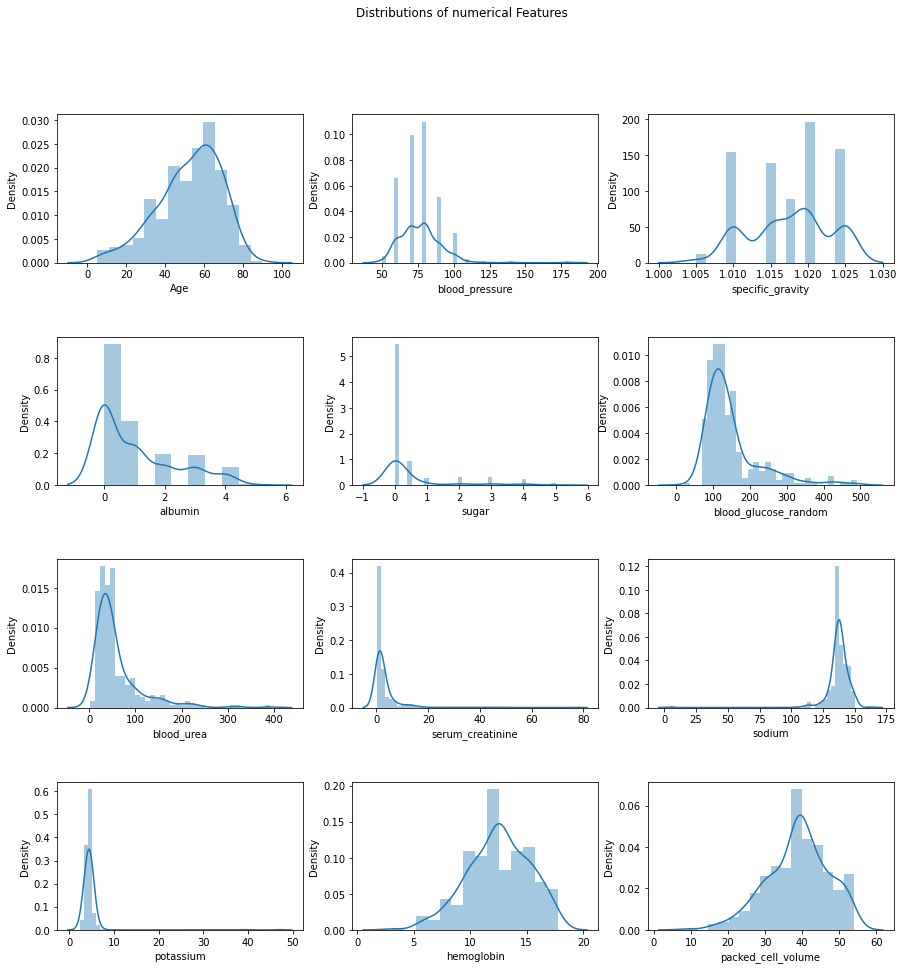

In [54]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15,15))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('Distributions of numerical Features')


for ax, feats in zip(axes.flatten(), df.select_dtypes(include=['float64'])):
    sns.distplot(a=df[feats], ax=ax)

## Observations:

age looks a bit right skewed

blood_pressure is left skewed

specific_gravity is lightly skewed

albumin  is left skewed

suger  is left skewed

Blood gluscose random is left skewed

Blood Urea  is left skewed

serunm creatinine  is left skewed

sodium is right skewwd

potassium  is left skewed

Hemoglobin  a bit right skewed

packed_cell_volume  a bit right skewed



## Normal distribution for Age for CKD and NOTCKD

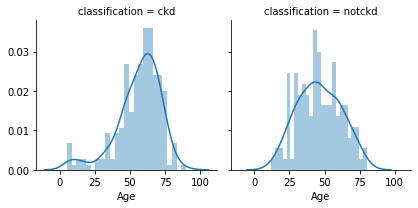

In [55]:
g = sns.FacetGrid(df,col="classification")
g.map(sns.distplot,"Age", bins=25)
plt.show()

## Variance for Numerical Features

In [56]:
np.var(df)

Id                        13804.335775
Age                         262.610466
blood_pressure              192.895061
specific_gravity              0.000029
albumin                       1.646805
sugar                         1.108956
blood_glucose_random       5692.355204
blood_urea                 2596.429741
serum_creatinine             34.192480
sodium                       93.663822
potassium                     8.896095
hemoglobin                    7.508368
packed_cell_volume           67.902992
white_blood_cell_count        0.736801
red_blood_cell_count          0.736801
dtype: float64

## Standard Deviation for Numerical Features

In [57]:
np.std(df)

Id                        117.491854
Age                        16.205260
blood_pressure             13.888667
specific_gravity            0.005375
albumin                     1.283279
sugar                       1.053070
blood_glucose_random       75.447698
blood_urea                 50.955174
serum_creatinine            5.847434
sodium                      9.678007
potassium                   2.982632
hemoglobin                  2.740140
packed_cell_volume          8.240327
white_blood_cell_count      0.858371
red_blood_cell_count        0.858371
dtype: float64

## Standard error of the mean

In [58]:
stats.sem(df.select_dtypes(include=['float64']))

array([8.61299875e-01, 7.38174302e-01, 2.85676612e-04, 6.82055152e-02,
       5.59700359e-02, 4.00999993e+00, 2.70823693e+00, 3.10787590e-01,
       5.14380275e-01, 1.58525115e-01, 1.45636805e-01, 4.37968449e-01,
       4.56219034e-02, 4.56219034e-02])

## Mode 

In [59]:
stats.mode(df)

ModeResult(mode=array([[0, 60.0, 80.0, 1.02, 0.0, 0.0, 'normal', 'normal', 'notpresent',
        'notpresent', 148.1341463414634, 46.0, 1.2, 137.4198606271777,
        4.6520979020979025, 12.525239616613417, 38.841750841750844,
        4.679268292682927, 4.679268292682927, 'no', 'no', 'no', 'good',
        'no', 'no', 'ckd']], dtype=object), count=array([[  1,  17, 108,  93, 175, 256, 314, 285, 313, 333,  27,  14,  37,
         68,  69,  42,  58, 109, 109, 216, 322, 322, 278, 287, 302, 220]]))

## Harmonic Mean

In [60]:
stats.hmean(df.select_dtypes(include=['float64']))

array([ 42.96719715,  74.46729617,   1.01749554,   0.        ,
         0.        , 124.14892381,  34.40774448,   1.2734962 ,
       126.89427375,   4.34731545,  11.78391576,  36.59108758,
         4.49776996,   4.49776996])

## Z-Score

In [61]:
stats.zscore(df.select_dtypes(include=['float64']))

array([[-2.93053857e+00, -1.92070679e+00, -1.39981375e+00, ...,
        -3.44858981e-01,  1.03472558e-15,  1.03472558e-15],
       [-2.86883022e+00, -1.20069527e+00, -1.39981375e+00, ...,
        -1.07298541e+00,  1.40652129e-01,  1.40652129e-01],
       [-2.80712186e+00, -1.92070679e+00,  4.60660577e-01, ...,
        -1.02150172e-01,  1.03472558e-15,  1.03472558e-15],
       ...,
       [ 1.82100493e+00,  2.39327774e-01, -1.39981375e+00, ...,
         1.40558637e-01, -5.58346331e-01, -5.58346331e-01],
       [ 1.88271329e+00, -4.80683749e-01,  4.60660577e-01, ...,
        -1.55840303e+00, -1.83984351e+00, -1.83984351e+00],
       [ 2.31467179e+00,  9.59339296e-01,  1.39089774e+00, ...,
        -2.23504577e-01, -9.07845561e-01, -9.07845561e-01]])

## probability plot for some numerical Features

(array([-2.88603847, -2.59463516, -2.43004007, -2.31295397, -2.22096715,
        -2.14464549, -2.07908848, -2.02141102, -1.96976551, -1.92289476,
        -1.87990311, -1.840129  , -1.8030694 , -1.76833251, -1.73560699,
        -1.70464119, -1.67522863, -1.64719779, -1.6204045 , -1.59472641,
        -1.57005874, -1.54631106, -1.52340473, -1.50127095, -1.47984914,
        -1.45908568, -1.43893287, -1.41934808, -1.40029307, -1.38173334,
        -1.36363774, -1.34597796, -1.32872825, -1.31186509, -1.29536695,
        -1.27921405, -1.26338819, -1.24787258, -1.2326517 , -1.21771116,
        -1.2030376 , -1.18861859, -1.17444257, -1.16049871, -1.1467769 ,
        -1.1332677 , -1.1199622 , -1.10685208, -1.09392949, -1.08118705,
        -1.06861778, -1.05621511, -1.04397282, -1.03188502, -1.01994615,
        -1.00815092, -0.99649431, -0.98497155, -0.9735781 , -0.96230965,
        -0.9511621 , -0.9401315 , -0.92921412, -0.91840639, -0.90770489,
        -0.89710634, -0.88660761, -0.87620571, -0.8

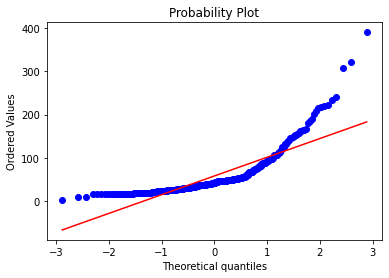

In [62]:
stats.probplot(df['blood_urea'], plot=plt , fit=False)


(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

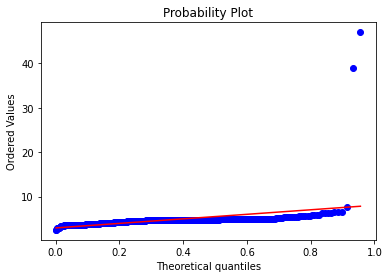

In [63]:
stats.probplot(df['potassium'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

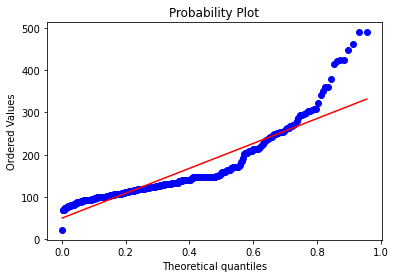

In [64]:
stats.probplot(df['blood_glucose_random'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

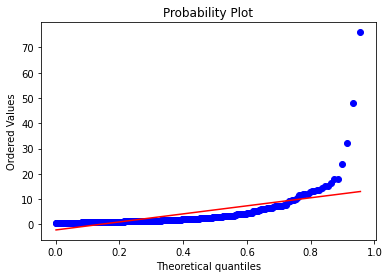

In [65]:
stats.probplot(df['serum_creatinine'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

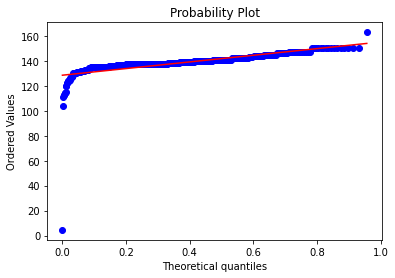

In [66]:
stats.probplot(df['sodium'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

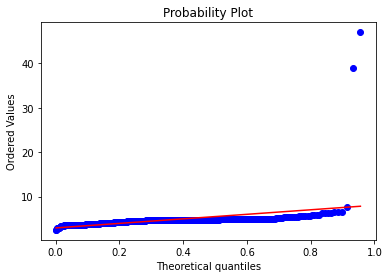

In [67]:
stats.probplot(df['potassium'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

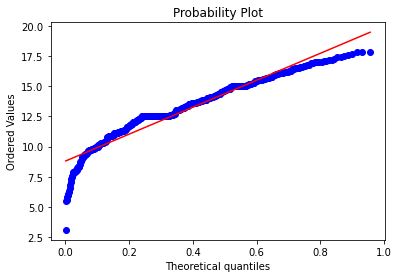

In [68]:
stats.probplot(df['hemoglobin'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

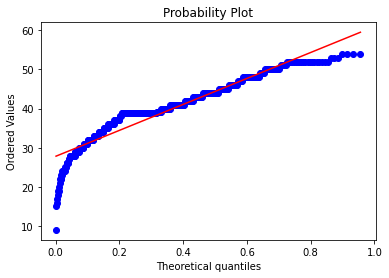

In [69]:
stats.probplot(df['packed_cell_volume'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

# Apply  the machine learning algorithms 

# define the high correlation between data 
 hemoglobin with packed cell volume 
 
hemoglobin with white blood cell count  x

hemoglobin with red blood cell count x

packed cell volume  with red blood cell count x

packed cell volume with white blood cell count x

white blood cell count with red blood cell count x

our traget is classification 

In [70]:
vif_data = pd.DataFrame()
#X_variables = df[['total_rooms','total_bedrooms','median_income']]
vif_data["feature"] = df.select_dtypes(include=['float64']).columns
vif_data["VIF"] = [variance_inflation_factor( df.select_dtypes(include=['float64']).values, i) for i in range(len( df.select_dtypes(include=['float64']).columns))]
vif_data.head(15)


,feature,VIF
0,Age,13.131968
1,blood_pressure,35.535082
2,specific_gravity,509.999835
3,albumin,2.725972
4,sugar,2.279852
5,blood_glucose_random,9.404942
6,blood_urea,5.111077
7,serum_creatinine,3.129328
8,sodium,404.360183
9,potassium,4.289498


so i will delete white_blood_cell_count and red_blood_cell_count and packed_cell_volume

## convert the Category data to numerical to apply for the algorithm 

In [71]:
from sklearn.preprocessing import LabelEncoder

class MultiColumnLabelEncoder:
    def __init__(self , columns = None):
        self.columns = columns
        
    def fit(self,X):
        return self
    
    def transform(self , X):
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X):
        fit = self.fit(X).transform(X)       
        return pd.DataFrame(fit , columns=self.columns)

In [73]:
df[df.select_dtypes(include=['object']).columns]= MultiColumnLabelEncoder(columns = df.select_dtypes(include=['object']).columns).fit_transform(df)

In [74]:
import statsmodels.api as sm
X = df.drop(['classification','Id','sugar','white_blood_cell_count','red_blood_cell_count','packed_cell_volume','bacteria'], axis=1)
y = df['classification']


In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [78]:
Scale = StandardScaler()
X_train[X_train.select_dtypes(include=['float64']).columns]=Scale.fit_transform(X_train[X_train.select_dtypes(include=['float64']).columns])


In [79]:
X_test[X_test.select_dtypes(include=['float64']).columns]=Scale.fit_transform(X_test[X_test.select_dtypes(include=['float64']).columns])

In [86]:
from sklearn.base import BaseEstimator
class DummyEstimator(BaseEstimator):
        def fit(self): 
            pass
        def score(self): pass
pipe = Pipeline(steps=[('estimator', DummyEstimator())])

# Add a dict of estimator and estimator related parameters in this list
params_grid = [{
                'estimator':[LogisticRegression()],
                'estimator__penalty': ['l1', 'l2'],
                'estimator__C':[0.001,.009,0.01,.09,1,5,10,25],
                },
                {
                'estimator':[SVC()],
                'estimator__C': [1, 10, 100, 1000],
                'estimator__gamma': [0.001, 0.0001],
                'estimator__kernel': ['linear','rbf'],
                },
                {
                'estimator': [KNeighborsClassifier()],
                'estimator__n_neighbors': [5,7,9,11,13,15],
                'estimator__weights': ['uniform', 'distance'],
                },
                {
                'estimator': [DecisionTreeClassifier()],
                'estimator__max_features': ['auto', 'sqrt', 'log2'],
                'estimator__min_samples_split': [2,3,4,5,6,7,8,9,10,11,12,13,14,15], 
                'estimator__min_samples_leaf':[1,2,3,4,5,6,7,8,9,10,11],
                },
                {
                'estimator': [RandomForestClassifier()],
                'estimator__n_estimators': [10,15,20,25,30],
                'estimator__min_samples_leaf': [1,2,3], 
                'estimator__min_samples_split':[3,4,5,6,7],
                },
               # {'estimator':[Any_other_estimator_you_want],
               #  'estimator__valid_param_of_your_estimator':[valid_values]

              ]

In [87]:
gs_clf = GridSearchCV(pipe, params_grid ,n_jobs=-1)
clf = gs_clf.fit(X_train, y_train)
clf.best_estimator_

Pipeline(steps=[('estimator',
                 RandomForestClassifier(min_samples_split=4, n_estimators=25))])

In [88]:
clf.best_score_

1.0

In [89]:
clf.best_params_

{'estimator': RandomForestClassifier(min_samples_split=4, n_estimators=25),
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 4,
 'estimator__n_estimators': 25}

In [90]:
prediction = clf.predict(X_test)
accuracy_score(prediction,y_test)

0.971830985915493

<AxesSubplot:>

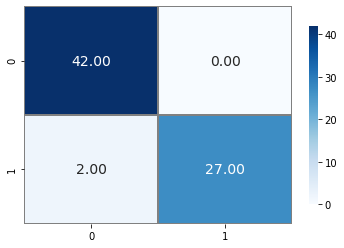

In [91]:
matrix =confusion_matrix(prediction,y_test)
sns.heatmap(matrix, annot=True,  
                  annot_kws={"size": 14},
                  fmt='.2f', cmap="Blues", cbar_kws={"shrink": .82},
                  linewidths=0.1, linecolor='gray')

In [92]:
print(classification_report(prediction, y_test))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98        42
           1       1.00      0.93      0.96        29

    accuracy                           0.97        71
   macro avg       0.98      0.97      0.97        71
weighted avg       0.97      0.97      0.97        71

